In [2]:
import matplotlib.pyplot as plt
import numpy as np
from obspy.core import Trace, Stream
from scipy.signal import hilbert, convolve

from twistpy.convenience import ricker
from twistpy.polarization import (
    TimeDomainAnalysis6C,
    TimeFrequencyAnalysis6C,
    PolarizationModel6C,
    SupportVectorMachine,
    EstimatorConfiguration,
)
from twistpy.utils import stransform

rng = np.random.default_rng(1)

In [3]:
# Generate an empty time series for each wave
N = 1000  # Number of samples in the time series
signal1 = np.zeros((N, 6))  # Each signal has six components
signal2 = np.zeros((N, 6))
signal3 = np.zeros((N, 6))
signal4 = np.zeros((N, 6))
signal5 = np.zeros((N, 6))

dt = 1.0 / 1000.0  # sampling interval
t = np.arange(0, signal1.shape[0]) * dt  # time axis
wavelet, t_wav, wcenter = ricker(
    t, 20.0
)  # generate a Ricker wavelet with 30 Hz center frequency
wavelet = wavelet[wcenter - int(len(t) / 2) : wcenter + int(len(t) / 2)]
wavelet_hilb = np.imag(
    hilbert(wavelet)
)  # Here we make use of the Hilbert transform to generate a Ricker wavelet
# with a 90 degree phase shift. This is to account for the fact that, for Rayleigh waves, the horizontal components are
# phase-shifted by 90 degrees with respect to the other components.

In [4]:
wave1 = PolarizationModel6C(
    wave_type="P", theta=20, phi=30, vp=1000, vs=400
)  # Generate a P-wave polarization model for
# a P-wave recorded at the free surface with an inclination of 20 degrees, an azimuth of 30 degrees. The local P- and
# S-wave velocities are 1000 m/s and 400 m/s
wave2 = PolarizationModel6C(
    wave_type="SV", theta=20, phi=30, vp=1000, vs=400
)  # Generate an SV-wave polarization model
wave3 = PolarizationModel6C(
    wave_type="SH", theta=20, phi=30, vs=400, vl=400
)  # Generate an SH-wave polarization model
wave4 = PolarizationModel6C(
    wave_type="L", phi=30, vl=300
)  # Generate a Love-wave polarization model
wave5 = PolarizationModel6C(
    wave_type="R", phi=30, vr=300, xi=-45
)  # Generate a Rayleigh-wave polarization model with a
# Rayleigh wave ellipticity angle of -45 degrees.

In [5]:
signal1[100, :] = wave1.polarization.real.T
signal2[300, :] = wave2.polarization.real.T
signal3[500, :] = wave3.polarization.real.T
signal4[700, :] = wave4.polarization.real.T
signal5[900, 2:] = np.real(wave5.polarization[2:].T)
signal5[900, 0:2] = np.imag(wave5.polarization[0:2].T)

for j in range(0, signal1.shape[1]):
    signal1[:, j] = convolve(signal1[:, j], wavelet, mode="same")
    signal2[:, j] = convolve(signal2[:, j], wavelet, mode="same")
    signal3[:, j] = convolve(signal3[:, j], wavelet, mode="same")
    signal4[:, j] = convolve(signal4[:, j], wavelet, mode="same")
    if (
        j == 0 or j == 1
    ):  # Special case for horizontal translational components of the Rayleigh wave
        signal5[:, j] = convolve(signal5[:, j], wavelet_hilb, mode="same")
    else:
        signal5[:, j] = convolve(signal5[:, j], wavelet, mode="same")

signal = signal1 + signal2 + signal3 + signal4 + signal5  # sum all signals together

Text(0.5, 0, 'Time (s)')

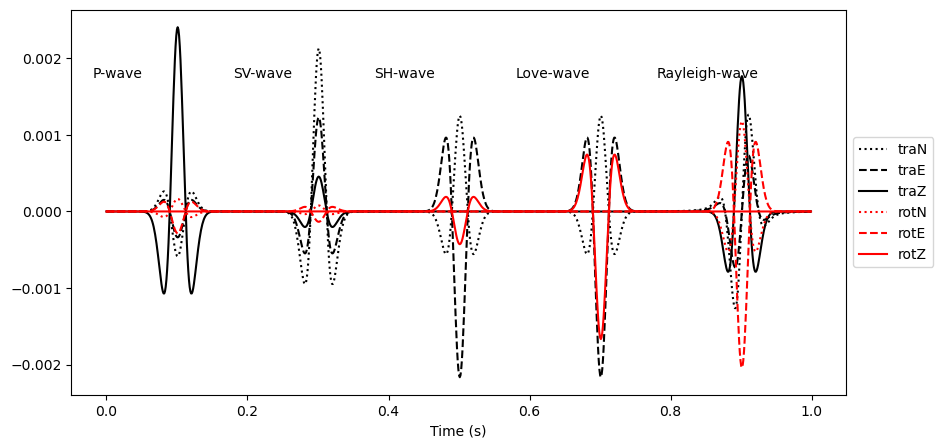

In [6]:
scaling_velocity = 400.0
signal[:, 0:3] /= scaling_velocity  # Apply scaling velocity to the translational data

plt.figure(figsize=(10, 5))
plt.plot(t, signal[:, 0], "k:", label="traN")
plt.plot(t, signal[:, 1], "k--", label="traE")
plt.plot(t, signal[:, 2], "k", label="traZ")
plt.plot(t, signal[:, 3], "r:", label="rotN")
plt.plot(t, signal[:, 4], "r--", label="rotE")
plt.plot(t, signal[:, 5], "r", label="rotZ")
plt.text((100 - 120) * dt, 0.7 / scaling_velocity, "P-wave")
plt.text((300 - 120) * dt, 0.7 / scaling_velocity, "SV-wave")
plt.text((500 - 120) * dt, 0.7 / scaling_velocity, "SH-wave")
plt.text((700 - 120) * dt, 0.7 / scaling_velocity, "Love-wave")
plt.text((900 - 120) * dt, 0.7 / scaling_velocity, "Rayleigh-wave")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.xlabel("Time (s)")

Text(0.5, 0, 'Time (s)')

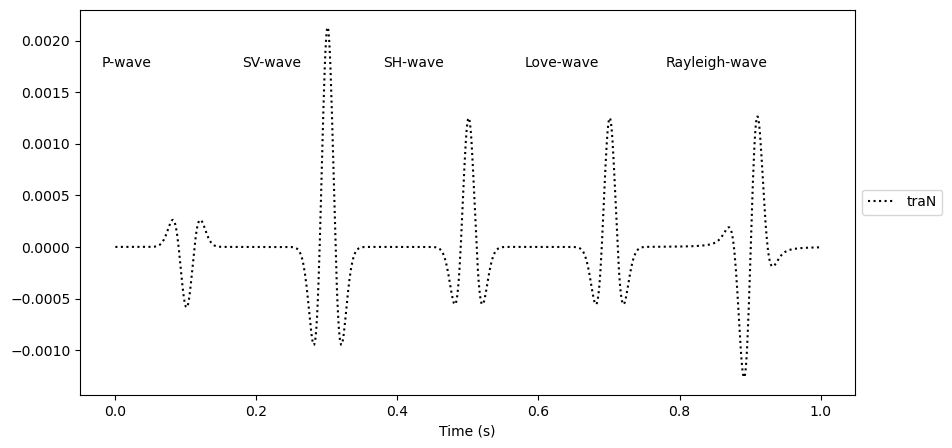

In [7]:
plt.figure(figsize=(10, 5))
plt.plot(t, signal[:, 0], "k:", label="traN")
plt.text((100 - 120) * dt, 0.7 / scaling_velocity, "P-wave")
plt.text((300 - 120) * dt, 0.7 / scaling_velocity, "SV-wave")
plt.text((500 - 120) * dt, 0.7 / scaling_velocity, "SH-wave")
plt.text((700 - 120) * dt, 0.7 / scaling_velocity, "Love-wave")
plt.text((900 - 120) * dt, 0.7 / scaling_velocity, "Rayleigh-wave")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.xlabel("Time (s)")

Text(0.5, 0, 'Time (s)')

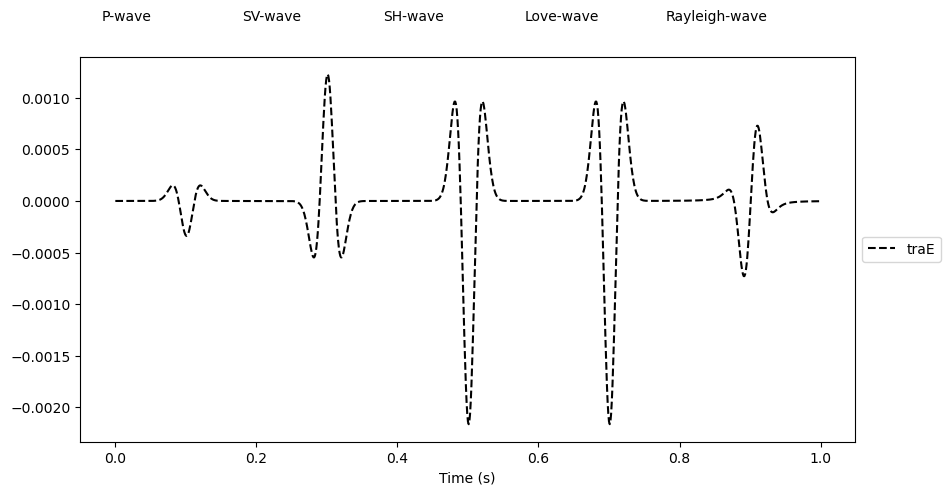

In [8]:
plt.figure(figsize=(10, 5))
plt.plot(t, signal[:, 1], "k--", label="traE")
plt.text((100 - 120) * dt, 0.7 / scaling_velocity, "P-wave")
plt.text((300 - 120) * dt, 0.7 / scaling_velocity, "SV-wave")
plt.text((500 - 120) * dt, 0.7 / scaling_velocity, "SH-wave")
plt.text((700 - 120) * dt, 0.7 / scaling_velocity, "Love-wave")
plt.text((900 - 120) * dt, 0.7 / scaling_velocity, "Rayleigh-wave")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.xlabel("Time (s)")

Text(0.5, 0, 'Time (s)')

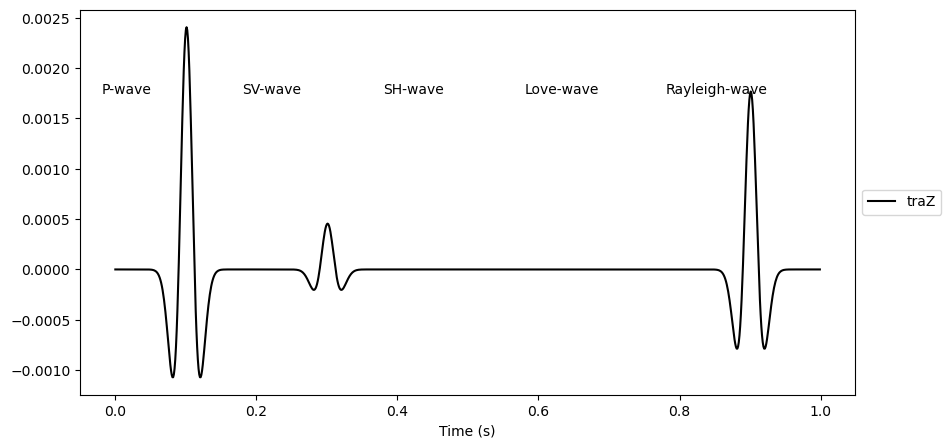

In [9]:
plt.figure(figsize=(10, 5))
plt.plot(t, signal[:, 2], "k", label="traZ")
plt.text((100 - 120) * dt, 0.7 / scaling_velocity, "P-wave")
plt.text((300 - 120) * dt, 0.7 / scaling_velocity, "SV-wave")
plt.text((500 - 120) * dt, 0.7 / scaling_velocity, "SH-wave")
plt.text((700 - 120) * dt, 0.7 / scaling_velocity, "Love-wave")
plt.text((900 - 120) * dt, 0.7 / scaling_velocity, "Rayleigh-wave")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.xlabel("Time (s)")

Text(0.5, 0, 'Time (s)')

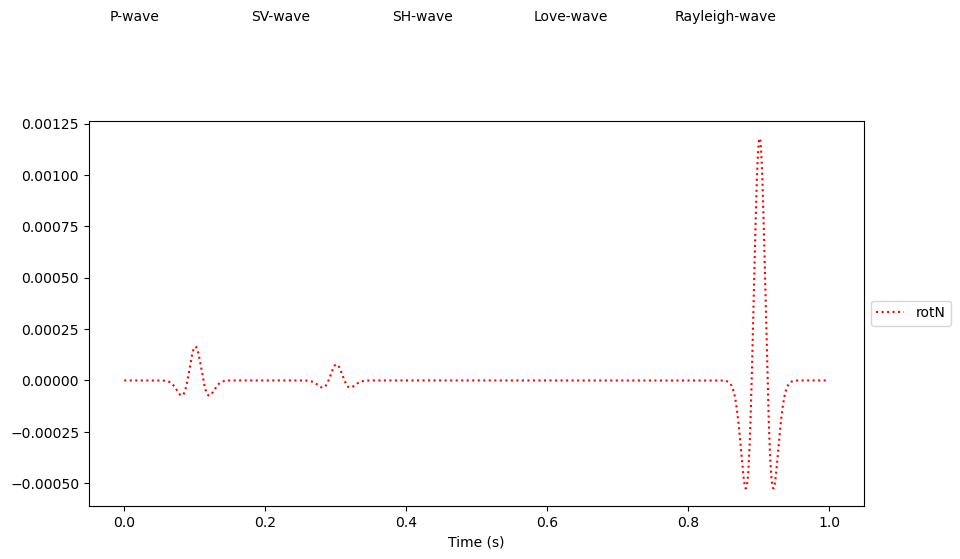

In [10]:
plt.figure(figsize=(10, 5))
plt.plot(t, signal[:, 3], "r:", label="rotN")
plt.text((100 - 120) * dt, 0.7 / scaling_velocity, "P-wave")
plt.text((300 - 120) * dt, 0.7 / scaling_velocity, "SV-wave")
plt.text((500 - 120) * dt, 0.7 / scaling_velocity, "SH-wave")
plt.text((700 - 120) * dt, 0.7 / scaling_velocity, "Love-wave")
plt.text((900 - 120) * dt, 0.7 / scaling_velocity, "Rayleigh-wave")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.xlabel("Time (s)")

Text(0.5, 0, 'Time (s)')

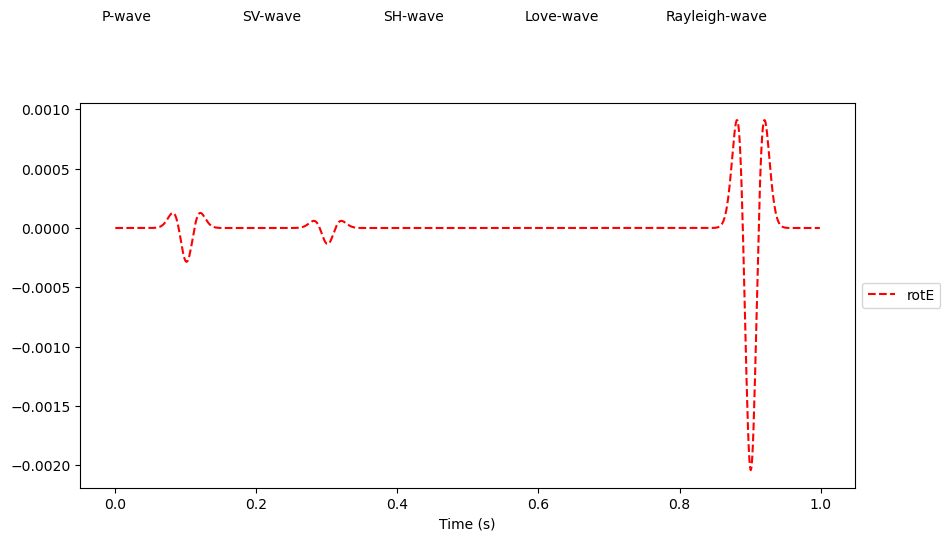

In [11]:
plt.figure(figsize=(10, 5))
plt.plot(t, signal[:, 4], "r--", label="rotE")
plt.text((100 - 120) * dt, 0.7 / scaling_velocity, "P-wave")
plt.text((300 - 120) * dt, 0.7 / scaling_velocity, "SV-wave")
plt.text((500 - 120) * dt, 0.7 / scaling_velocity, "SH-wave")
plt.text((700 - 120) * dt, 0.7 / scaling_velocity, "Love-wave")
plt.text((900 - 120) * dt, 0.7 / scaling_velocity, "Rayleigh-wave")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.xlabel("Time (s)")

Text(0.5, 0, 'Time (s)')

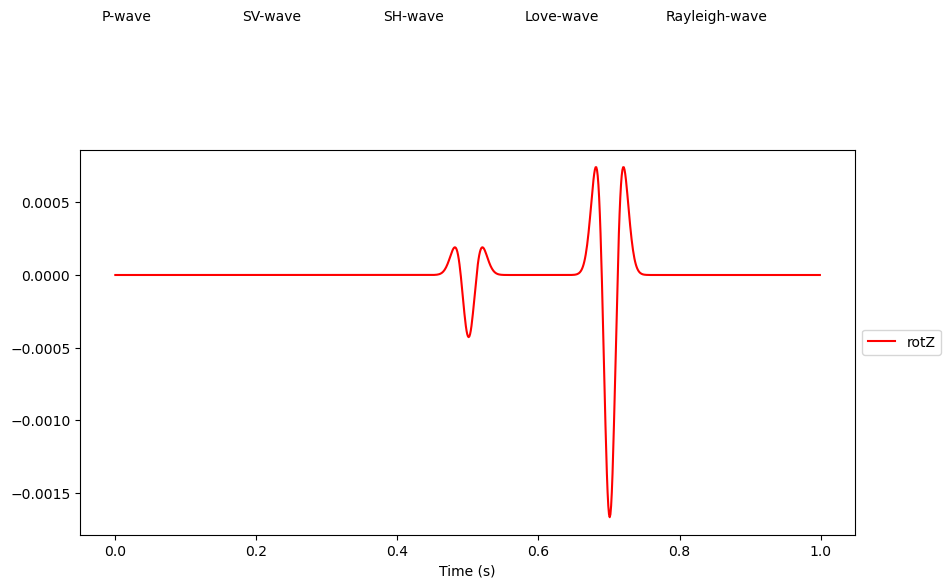

In [12]:
plt.figure(figsize=(10, 5))
plt.plot(t, signal[:, 5], "r", label="rotZ")
plt.text((100 - 120) * dt, 0.7 / scaling_velocity, "P-wave")
plt.text((300 - 120) * dt, 0.7 / scaling_velocity, "SV-wave")
plt.text((500 - 120) * dt, 0.7 / scaling_velocity, "SH-wave")
plt.text((700 - 120) * dt, 0.7 / scaling_velocity, "Love-wave")
plt.text((900 - 120) * dt, 0.7 / scaling_velocity, "Rayleigh-wave")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.xlabel("Time (s)")

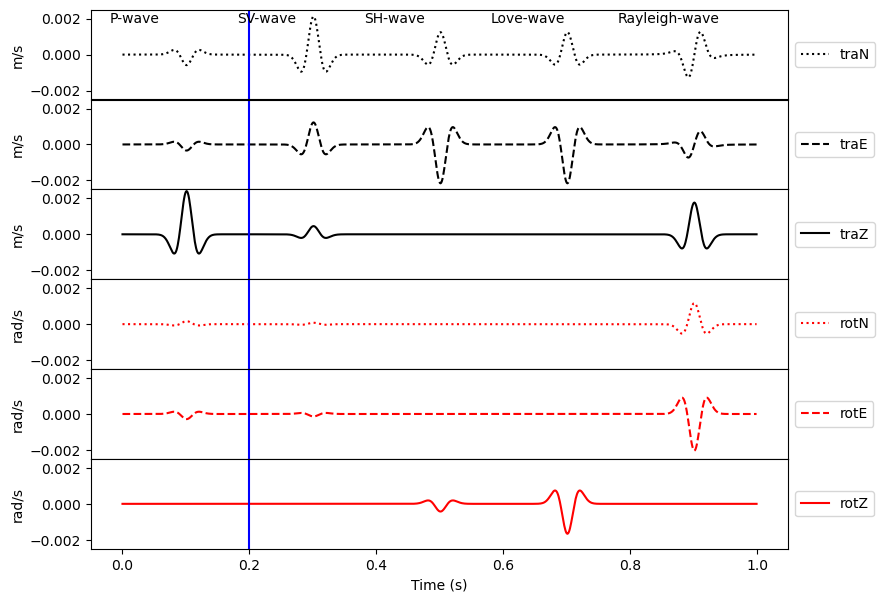

In [29]:
fig = plt.figure(figsize=(9,7))
fig.subplots_adjust(hspace=0.001)

ax1 = fig.add_subplot(6,1,1)
plt.plot(t, signal[:, 0], "k:", label="traN")
plt.text((100 - 120) * dt, 0.7 / scaling_velocity, "P-wave")
plt.text((300 - 120) * dt, 0.7 / scaling_velocity, "SV-wave")
plt.text((500 - 120) * dt, 0.7 / scaling_velocity, "SH-wave")
plt.text((700 - 120) * dt, 0.7 / scaling_velocity, "Love-wave")
plt.text((900 - 120) * dt, 0.7 / scaling_velocity, "Rayleigh-wave")
plt.vlines(x=0.2,ymin=-0.0025,ymax=0.0025,color="blue")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.ylabel("m/s")
plt.ylim(-0.0025,0.0025)
plt.xticks([],[])

ax2 = fig.add_subplot(6,1,2)
plt.plot(t, signal[:, 1], "k--", label="traE")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.ylabel("m/s")
plt.vlines(x=0.2,ymin=-0.0025,ymax=0.0025,color="blue")
plt.ylim(-0.0025,0.0025)
plt.xticks([],[])

ax3 = fig.add_subplot(6,1,3)
plt.plot(t, signal[:, 2], "k", label="traZ")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.ylabel("m/s")
plt.vlines(x=0.2,ymin=-0.0025,ymax=0.0025,color="blue")
plt.ylim(-0.0025,0.0025)
plt.xticks([],[])

ax4 = fig.add_subplot(6,1,4)
plt.plot(t, signal[:, 3], "r:", label="rotN")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.ylabel("rad/s")
plt.vlines(x=0.2,ymin=-0.0025,ymax=0.0025,color="blue")
plt.ylim(-0.0025,0.0025)
plt.xticks([],[])

ax5 = fig.add_subplot(6,1,5)
plt.plot(t, signal[:, 4], "r--", label="rotE")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.ylabel("rad/s")
plt.ylim(-0.0025,0.0025)
plt.vlines(x=0.2,ymin=-0.0025,ymax=0.0025,color="blue")
plt.xticks([],[])

ax6 = fig.add_subplot(6,1,6)
plt.plot(t, signal[:, 5], "r", label="rotZ")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.xlabel("Time (s)")
plt.ylabel("rad/s")
plt.ylim(-0.0025,0.0025)
plt.vlines(x=0.2,ymin=-0.0025,ymax=0.0025,color="blue")
plt.show()

In [31]:
print(len(t))

1000


In [32]:
t

array([0.   , 0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008,
       0.009, 0.01 , 0.011, 0.012, 0.013, 0.014, 0.015, 0.016, 0.017,
       0.018, 0.019, 0.02 , 0.021, 0.022, 0.023, 0.024, 0.025, 0.026,
       0.027, 0.028, 0.029, 0.03 , 0.031, 0.032, 0.033, 0.034, 0.035,
       0.036, 0.037, 0.038, 0.039, 0.04 , 0.041, 0.042, 0.043, 0.044,
       0.045, 0.046, 0.047, 0.048, 0.049, 0.05 , 0.051, 0.052, 0.053,
       0.054, 0.055, 0.056, 0.057, 0.058, 0.059, 0.06 , 0.061, 0.062,
       0.063, 0.064, 0.065, 0.066, 0.067, 0.068, 0.069, 0.07 , 0.071,
       0.072, 0.073, 0.074, 0.075, 0.076, 0.077, 0.078, 0.079, 0.08 ,
       0.081, 0.082, 0.083, 0.084, 0.085, 0.086, 0.087, 0.088, 0.089,
       0.09 , 0.091, 0.092, 0.093, 0.094, 0.095, 0.096, 0.097, 0.098,
       0.099, 0.1  , 0.101, 0.102, 0.103, 0.104, 0.105, 0.106, 0.107,
       0.108, 0.109, 0.11 , 0.111, 0.112, 0.113, 0.114, 0.115, 0.116,
       0.117, 0.118, 0.119, 0.12 , 0.121, 0.122, 0.123, 0.124, 0.125,
       0.126, 0.127,

In [33]:
def plot_fig(x_val,i):
    fig = plt.figure(figsize=(9,7))
    fig.subplots_adjust(hspace=0.001)

    ax1 = fig.add_subplot(6,1,1)
    plt.plot(t, signal[:, 0], "k:", label="traN")
    plt.text((100 - 120) * dt, 0.7 / scaling_velocity, "P-wave")
    plt.text((300 - 120) * dt, 0.7 / scaling_velocity, "SV-wave")
    plt.text((500 - 120) * dt, 0.7 / scaling_velocity, "SH-wave")
    plt.text((700 - 120) * dt, 0.7 / scaling_velocity, "Love-wave")
    plt.text((900 - 120) * dt, 0.7 / scaling_velocity, "Rayleigh-wave")
    plt.vlines(x=x_val,ymin=-0.0025,ymax=0.0025,color="blue")
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.ylabel("m/s")
    plt.ylim(-0.0025,0.0025)
    plt.xticks([],[])

    ax2 = fig.add_subplot(6,1,2)
    plt.plot(t, signal[:, 1], "k--", label="traE")
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.ylabel("m/s")
    plt.vlines(x=x_val,ymin=-0.0025,ymax=0.0025,color="blue")
    plt.ylim(-0.0025,0.0025)
    plt.xticks([],[])

    ax3 = fig.add_subplot(6,1,3)
    plt.plot(t, signal[:, 2], "k", label="traZ")
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.ylabel("m/s")
    plt.vlines(x=x_val,ymin=-0.0025,ymax=0.0025,color="blue")
    plt.ylim(-0.0025,0.0025)
    plt.xticks([],[])

    ax4 = fig.add_subplot(6,1,4)
    plt.plot(t, signal[:, 3], "r:", label="rotN")
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.ylabel("rad/s")
    plt.vlines(x=x_val,ymin=-0.0025,ymax=0.0025,color="blue")
    plt.ylim(-0.0025,0.0025)
    plt.xticks([],[])

    ax5 = fig.add_subplot(6,1,5)
    plt.plot(t, signal[:, 4], "r--", label="rotE")
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.ylabel("rad/s")
    plt.ylim(-0.0025,0.0025)
    plt.vlines(x=x_val,ymin=-0.0025,ymax=0.0025,color="blue")
    plt.xticks([],[])

    ax6 = fig.add_subplot(6,1,6)
    plt.plot(t, signal[:, 5], "r", label="rotZ")
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.xlabel("Time (s)")
    plt.ylabel("rad/s")
    plt.ylim(-0.0025,0.0025)
    plt.vlines(x=x_val,ymin=-0.0025,ymax=0.0025,color="blue")
    #plt.show()
    
    print('frame: ', i, ' / ', len(t))
    plt.savefig('C:\\Users\\Sabrina Keil\\Documents\\PhD\\Meetings\\Defense\\plots_waves\\'+str(i).zfill(5)+'.png')

frame:  0  /  1000
frame:  1  /  1000
frame:  2  /  1000
frame:  3  /  1000
frame:  4  /  1000
frame:  5  /  1000
frame:  6  /  1000
frame:  7  /  1000
frame:  8  /  1000
frame:  9  /  1000
frame:  10  /  1000
frame:  11  /  1000
frame:  12  /  1000
frame:  13  /  1000
frame:  14  /  1000
frame:  15  /  1000
frame:  16  /  1000
frame:  17  /  1000
frame:  18  /  1000
frame:  19  /  1000


C:\Users\Sabrina Keil\AppData\Local\Temp\ipykernel_8712\2233168606.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(9,7))


frame:  20  /  1000
frame:  21  /  1000
frame:  22  /  1000
frame:  23  /  1000
frame:  24  /  1000
frame:  25  /  1000
frame:  26  /  1000
frame:  27  /  1000
frame:  28  /  1000
frame:  29  /  1000
frame:  30  /  1000
frame:  31  /  1000
frame:  32  /  1000
frame:  33  /  1000
frame:  34  /  1000
frame:  35  /  1000
frame:  36  /  1000
frame:  37  /  1000
frame:  38  /  1000
frame:  39  /  1000
frame:  40  /  1000
frame:  41  /  1000
frame:  42  /  1000
frame:  43  /  1000
frame:  44  /  1000
frame:  45  /  1000
frame:  46  /  1000
frame:  47  /  1000
frame:  48  /  1000
frame:  49  /  1000
frame:  50  /  1000
frame:  51  /  1000
frame:  52  /  1000
frame:  53  /  1000
frame:  54  /  1000
frame:  55  /  1000
frame:  56  /  1000
frame:  57  /  1000
frame:  58  /  1000
frame:  59  /  1000
frame:  60  /  1000
frame:  61  /  1000
frame:  62  /  1000
frame:  63  /  1000
frame:  64  /  1000
frame:  65  /  1000
frame:  66  /  1000
frame:  67  /  1000
frame:  68  /  1000
frame:  69  /  1000


frame:  414  /  1000
frame:  415  /  1000
frame:  416  /  1000
frame:  417  /  1000
frame:  418  /  1000
frame:  419  /  1000
frame:  420  /  1000
frame:  421  /  1000
frame:  422  /  1000
frame:  423  /  1000
frame:  424  /  1000
frame:  425  /  1000
frame:  426  /  1000
frame:  427  /  1000
frame:  428  /  1000
frame:  429  /  1000
frame:  430  /  1000
frame:  431  /  1000
frame:  432  /  1000
frame:  433  /  1000
frame:  434  /  1000
frame:  435  /  1000
frame:  436  /  1000
frame:  437  /  1000
frame:  438  /  1000
frame:  439  /  1000
frame:  440  /  1000
frame:  441  /  1000
frame:  442  /  1000
frame:  443  /  1000
frame:  444  /  1000
frame:  445  /  1000
frame:  446  /  1000
frame:  447  /  1000
frame:  448  /  1000
frame:  449  /  1000
frame:  450  /  1000
frame:  451  /  1000
frame:  452  /  1000
frame:  453  /  1000
frame:  454  /  1000
frame:  455  /  1000
frame:  456  /  1000
frame:  457  /  1000
frame:  458  /  1000
frame:  459  /  1000
frame:  460  /  1000
frame:  461  

frame:  805  /  1000
frame:  806  /  1000
frame:  807  /  1000
frame:  808  /  1000
frame:  809  /  1000
frame:  810  /  1000
frame:  811  /  1000
frame:  812  /  1000
frame:  813  /  1000
frame:  814  /  1000
frame:  815  /  1000
frame:  816  /  1000
frame:  817  /  1000
frame:  818  /  1000
frame:  819  /  1000
frame:  820  /  1000
frame:  821  /  1000
frame:  822  /  1000
frame:  823  /  1000
frame:  824  /  1000
frame:  825  /  1000
frame:  826  /  1000
frame:  827  /  1000
frame:  828  /  1000
frame:  829  /  1000
frame:  830  /  1000
frame:  831  /  1000
frame:  832  /  1000
frame:  833  /  1000
frame:  834  /  1000
frame:  835  /  1000
frame:  836  /  1000
frame:  837  /  1000
frame:  838  /  1000
frame:  839  /  1000
frame:  840  /  1000
frame:  841  /  1000
frame:  842  /  1000
frame:  843  /  1000
frame:  844  /  1000
frame:  845  /  1000
frame:  846  /  1000
frame:  847  /  1000
frame:  848  /  1000
frame:  849  /  1000
frame:  850  /  1000
frame:  851  /  1000
frame:  852  

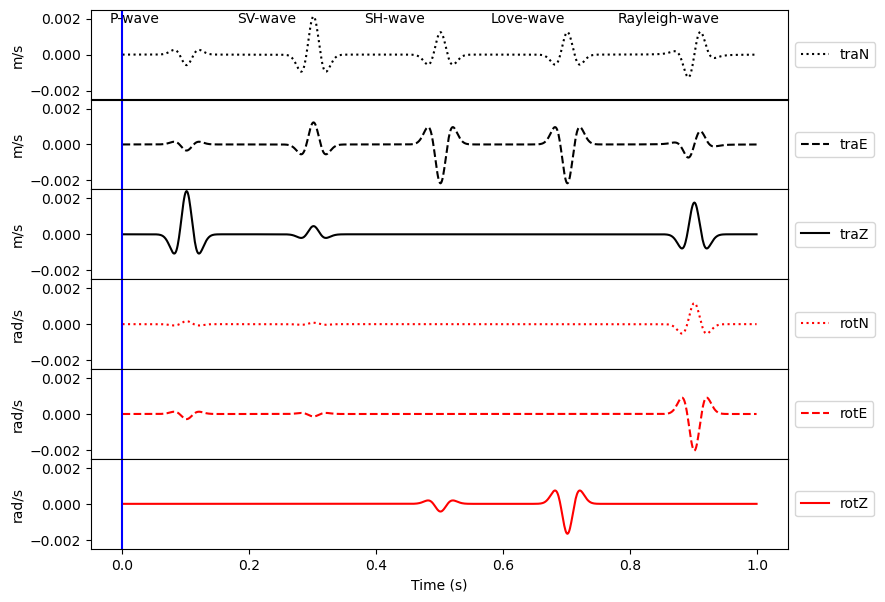

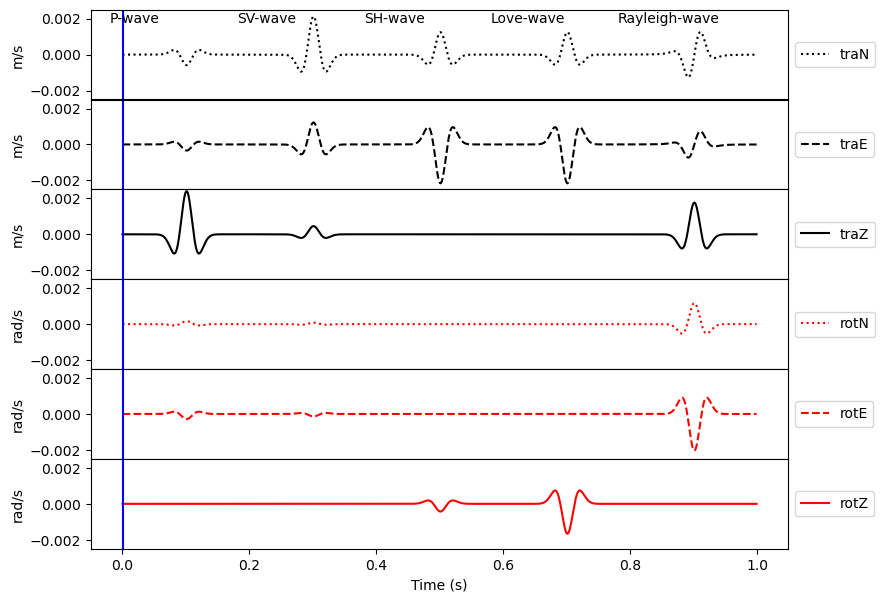

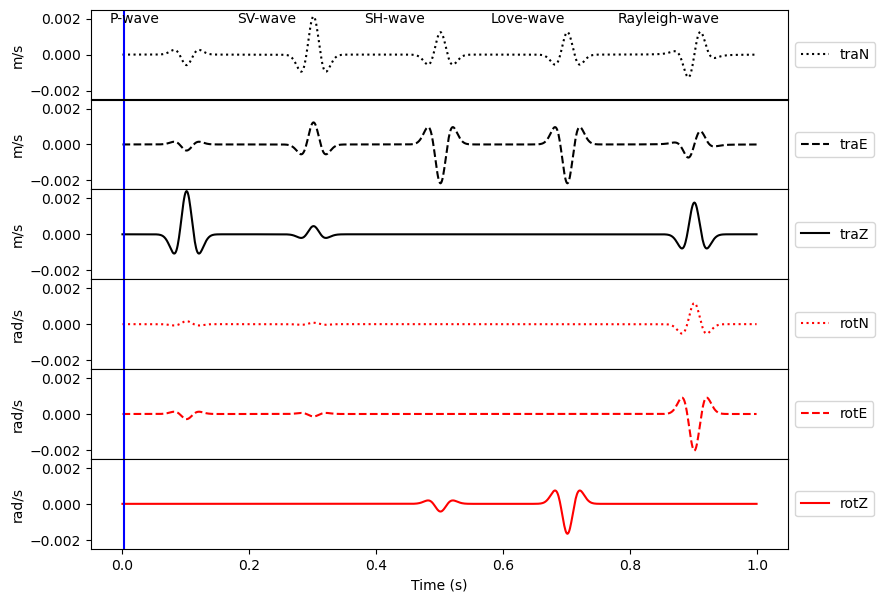

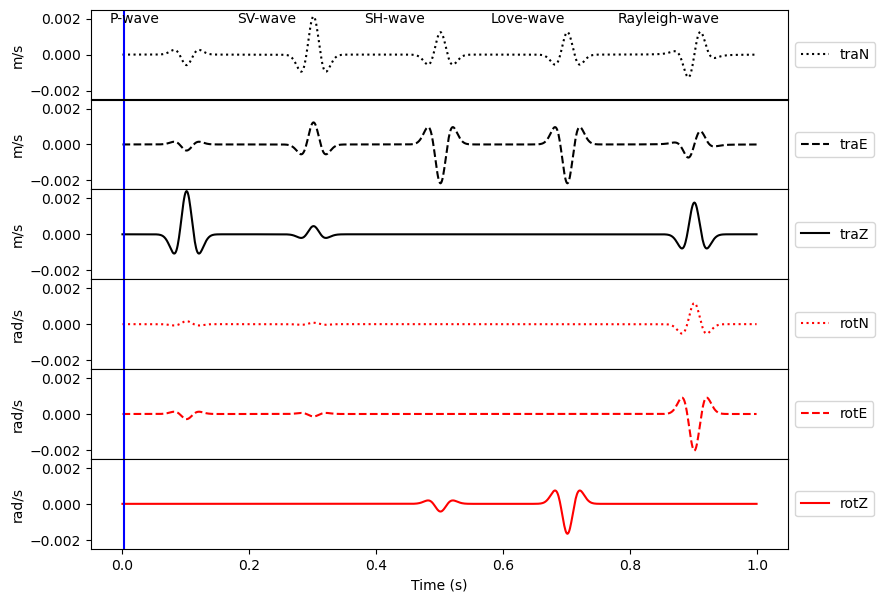

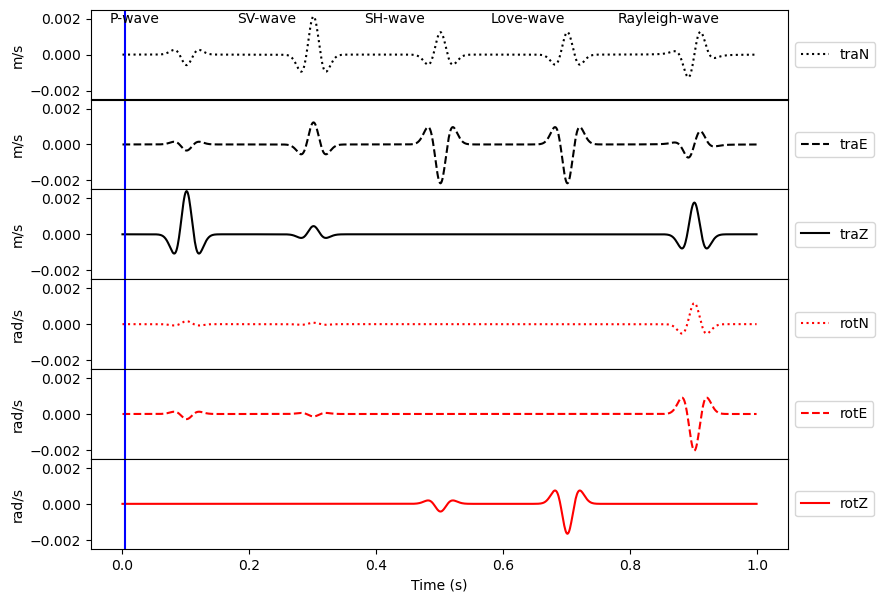

...

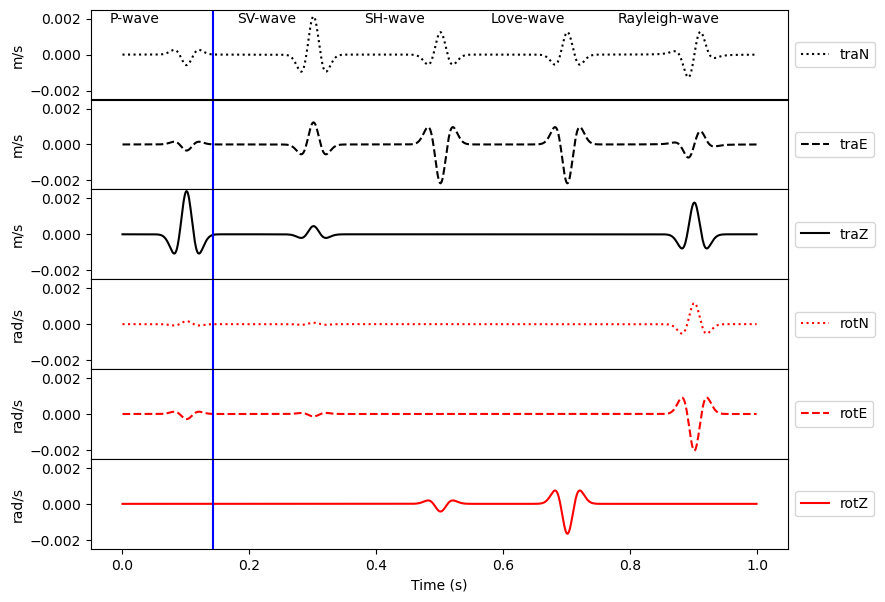

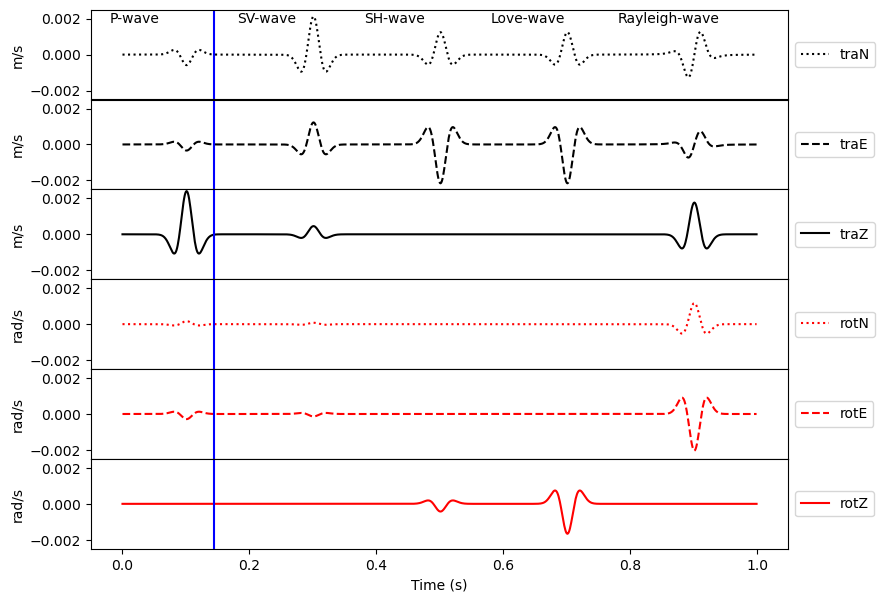

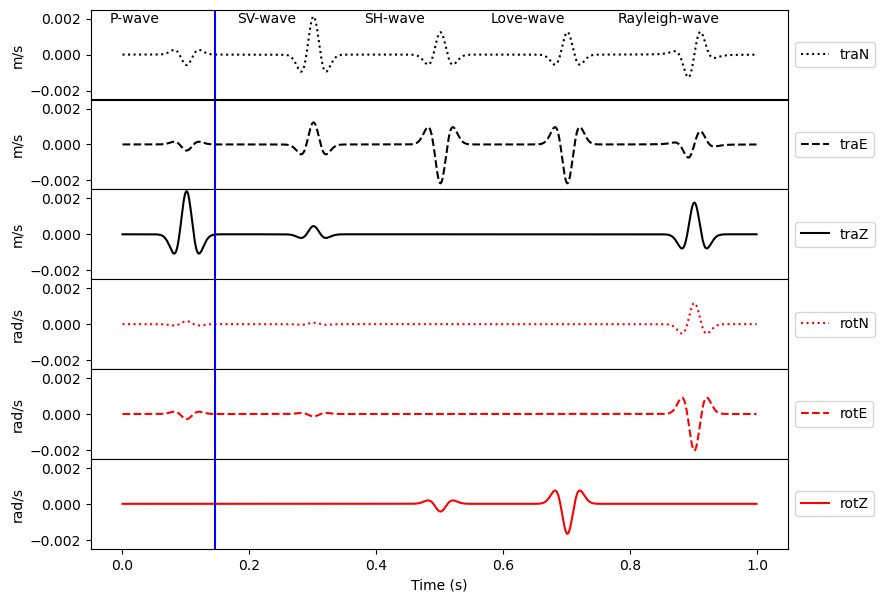

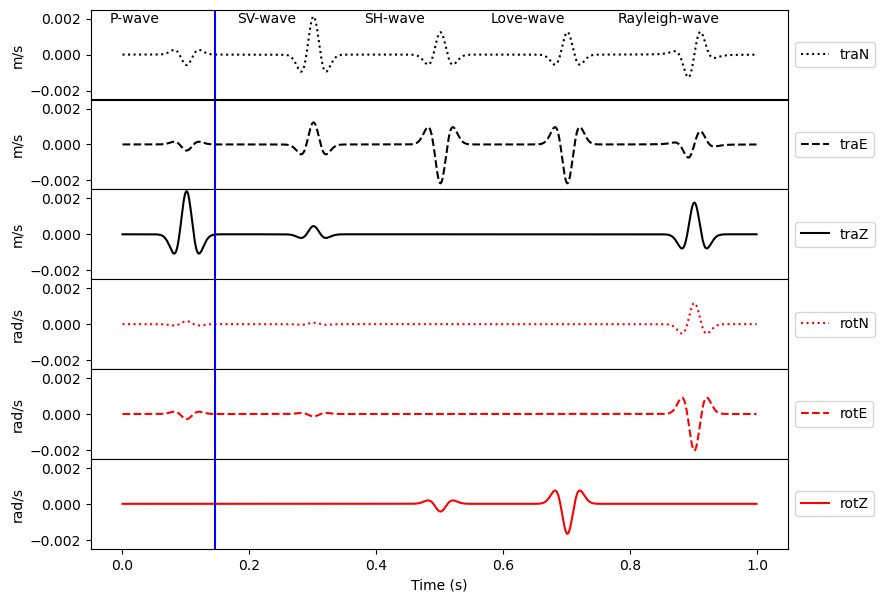

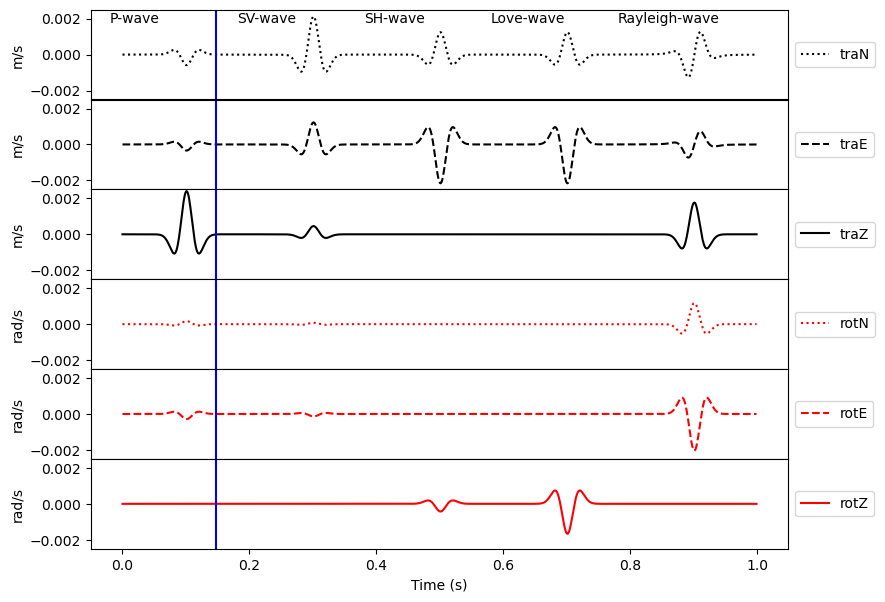

Error in callback <function flush_figures at 0x0000024A6045C8B0> (for post_execute):


KeyboardInterrupt: 

In [35]:
for i in range(len(t)):
    plot_fig(t[i],i)